# Practical Application III: Comparing Classifiers

**Overview**: In this practical application, your goal is to compare the performance of the classifiers we encountered in this section, namely K Nearest Neighbor, Logistic Regression, Decision Trees, and Support Vector Machines.  We will utilize a dataset related to marketing bank products over the telephone.  



### Getting Started

Our dataset comes from the UCI Machine Learning repository [link](https://archive.ics.uci.edu/ml/datasets/bank+marketing).  The data is from a Portugese banking institution and is a collection of the results of multiple marketing campaigns.  We will make use of the article accompanying the dataset [here](CRISP-DM-BANK.pdf) for more information on the data and features.



### Problem 1: Understanding the Data

To gain a better understanding of the data, please read the information provided in the UCI link above, and examine the **Materials and Methods** section of the paper.  How many marketing campaigns does this data represent?

This data represent 45211 instances.

### Problem 2: Read in the Data

Use pandas to read in the dataset `bank-additional-full.csv` and assign to a meaningful variable name.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, recall_score, precision_score, confusion_matrix
import time
from sklearn.pipeline import Pipeline
from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

In [2]:
#Load data
df = pd.read_csv('bank-additional-full.csv', sep = ';')

In [3]:
#Display all columns
pd.set_option('display.max_columns', None)

In [4]:
#Show first 10 rows
df.head(10)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
5,45,services,married,basic.9y,unknown,no,no,telephone,may,mon,198,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
6,59,admin.,married,professional.course,no,no,no,telephone,may,mon,139,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
7,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,217,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
8,24,technician,single,professional.course,no,yes,no,telephone,may,mon,380,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
9,25,services,single,high.school,no,yes,no,telephone,may,mon,50,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


### Problem 3: Understanding the Features


Examine the data description below, and determine if any of the features are missing values or need to be coerced to a different data type.


```
Input variables:
# bank client data:
1 - age (numeric)
2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5 - default: has credit in default? (categorical: 'no','yes','unknown')
6 - housing: has housing loan? (categorical: 'no','yes','unknown')
7 - loan: has personal loan? (categorical: 'no','yes','unknown')
# related with the last contact of the current campaign:
8 - contact: contact communication type (categorical: 'cellular','telephone')
9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
# other attributes:
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14 - previous: number of contacts performed before this campaign and for this client (numeric)
15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
# social and economic context attributes
16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
17 - cons.price.idx: consumer price index - monthly indicator (numeric)
18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)
19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
20 - nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):
21 - y - has the client subscribed a term deposit? (binary: 'yes','no')
```



### Problem 4: Understanding the Task

After examining the description and data, your goal now is to clearly state the *Business Objective* of the task.  State the objective below.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [6]:
#Check for null values
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [7]:
#Count the number of unknown values in each column
unknown_values = df.eq('unknown').sum()

#Calculate the percentage of unknown values
unknown_percentages = unknown_values / len(df) * 100

#Create a DataFrame to store the results
results = pd.DataFrame({'Column': unknown_values.index,
                         'Count of Unknowns': unknown_values,
                         'Percentage of Unknowns': unknown_percentages})

#Sort the DataFrame by the 'Percentage of Unknowns' column in descending order
results = results.sort_values(by='Percentage of Unknowns', ascending=False)

#Display the results in a table
print(results.to_string(index=False))

        Column  Count of Unknowns  Percentage of Unknowns
       default               8597               20.872584
     education               1731                4.202680
       housing                990                2.403613
          loan                990                2.403613
           job                330                0.801204
       marital                 80                0.194231
           age                  0                0.000000
      poutcome                  0                0.000000
   nr.employed                  0                0.000000
     euribor3m                  0                0.000000
 cons.conf.idx                  0                0.000000
cons.price.idx                  0                0.000000
  emp.var.rate                  0                0.000000
      duration                  0                0.000000
      previous                  0                0.000000
         pdays                  0                0.000000
      campaign

In [8]:
# Count the number of '999' values in the pdays column
count_999 = df[df['pdays'] == 999].shape[0]

print(count_999)

39673


In [9]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


### Problem 5: Engineering Features

Now that you understand your business objective, we will build a basic model to get started.  Before we can do this, we must work to encode the data.  Using just the bank information features (columns 1 - 7), prepare the features and target column for modeling with appropriate encoding and transformations.

In [10]:
#Split columns into categorical and numerical
categorical_cols = ['job',
                    'marital',
                    'education',
                    'default',
                    'housing',
                    'loan',
                    'contact',
                    'month',
                    'day_of_week',
                    'poutcome',
                   'y']
numerical_cols = ['age',
                  'duration',
                  'campaign',
                  'pdays',
                  'previous',
                  'emp.var.rate',
                  'cons.price.idx',
                  'cons.conf.idx',
                  'euribor3m',
                  'nr.employed']

In [29]:
for col in categorical_cols:
    title = f"Count of {col.title()}"
    fig = px.histogram(df, x=col, title=title)
    fig.update_layout(xaxis_title=col.title(), yaxis_title='Count')
    fig.show()

In [12]:
#Create a list of categorical columns to OHE
ohe_mult_cols = ['job',
                 'marital',
                 'education',
                 'default',
                 'month',
                 'day_of_week',
                 'poutcome']
ohe_bin_cols = ['housing',
                'loan',
                'contact',
               'y']

#Create a new df and OHE categorical variables 
df_ohe = pd.get_dummies(df, columns = ohe_mult_cols, dtype='int', drop_first=False)
df_ohe = pd.get_dummies(df_ohe, columns = ohe_bin_cols, dtype='int', drop_first=True)

#Show the first few rows of the new df
df_ohe.head()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown,marital_divorced,marital_married,marital_single,marital_unknown,education_basic.4y,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,education_unknown,default_no,default_unknown,default_yes,month_apr,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,housing_unknown,housing_yes,loan_unknown,loan_yes,contact_telephone,y_yes
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
4,56,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0


In [13]:
df_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 61 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            41188 non-null  int64  
 1   duration                       41188 non-null  int64  
 2   campaign                       41188 non-null  int64  
 3   pdays                          41188 non-null  int64  
 4   previous                       41188 non-null  int64  
 5   emp.var.rate                   41188 non-null  float64
 6   cons.price.idx                 41188 non-null  float64
 7   cons.conf.idx                  41188 non-null  float64
 8   euribor3m                      41188 non-null  float64
 9   nr.employed                    41188 non-null  float64
 10  job_admin.                     41188 non-null  int64  
 11  job_blue-collar                41188 non-null  int64  
 12  job_entrepreneur               41188 non-null 

In [14]:
X = df_ohe[list(df_ohe.drop(columns=['y_yes']).columns)]
y = df_ohe['y_yes']

### Problem 6: Train/Test Split

With your data prepared, split it into a train and test set.

In [15]:
# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=df_ohe['y_yes'], random_state=42)

In [16]:
#Ensure train/test split worked
print("X_train shape: ", X_train.shape)
print("y_train shape: ", y_train.shape)
print("X_test shape: ", X_test.shape)
print("y_test shape: ", y_test.shape)

X_train shape:  (32950, 60)
y_train shape:  (32950,)
X_test shape:  (8238, 60)
y_test shape:  (8238,)


In [17]:
#StandardScaler
scaler = StandardScaler()

#Transform the training data
X_train_scaled = scaler.fit_transform(X_train)

#Transform the test data
X_test_scaled = scaler.transform(X_test)

### Problem 7: A Baseline Model

Before we build our first model, we want to establish a baseline.  What is the baseline performance that our classifier should aim to beat?

In [18]:
#Create dummy classifier
base = DummyClassifier(strategy='most_frequent')
base.fit(X_train, y_train)

#Make predictions 
base_pred = base.predict(X_test)

#Calculate metrics and print metrics 
base_acc = accuracy_score(y_test, base_pred)
print(f"Baseline Accuracy (Most Frequent): {base_acc:.5f}")

base_prec = precision_score(y_test, base_pred, zero_division=0)
print(f"Baseline Precision (Most Frequent): {base_prec:.5f}")

base_recall = recall_score(y_test, base_pred)
print(f"Baseline Recall (Most Frequent): {base_recall:.5f}")

base_f1 = f1_score(y_test, base_pred)
print(f"Baseline F1 (Most Frequent): {base_f1:.5f}")

base_roc_auc = roc_auc_score(y_test, base.predict_proba(X_test)[:,1])
print(f"Baseline ROC AUC (Most Frequent): {base_roc_auc:.5f}")

Baseline Accuracy (Most Frequent): 0.88735
Baseline Precision (Most Frequent): 0.00000
Baseline Recall (Most Frequent): 0.00000
Baseline F1 (Most Frequent): 0.00000
Baseline ROC AUC (Most Frequent): 0.50000


In [19]:
#Create dummy classifier
random_baseline = DummyClassifier(strategy='uniform', random_state=42)
random_baseline.fit(X_train, y_train)

#Make predictions 
random_pred = random_baseline.predict(X_test)

#Calculate metrics and print metrics
random_acc = accuracy_score(y_test, random_pred)
print(f"Baseline Accuracy (Random): {random_acc:.5f}")

random_prec = precision_score(y_test, random_pred, zero_division=0)
print(f"Baseline Precision (Random): {random_prec:.5f}")

random_recall = recall_score(y_test, random_pred)
print(f"Baseline Recall (Random): {random_recall:.5f}")

random_f1 = f1_score(y_test, random_pred)
print(f"Baseline F1 (Random): {random_f1:.5f}")

random_roc_auc = roc_auc_score(y_test, random_baseline.predict_proba(X_test)[:, 1])
print(f"Baseline ROC AUC (Random): {random_roc_auc:.5f}")

Baseline Accuracy (Random): 0.49866
Baseline Precision (Random): 0.11103
Baseline Recall (Random): 0.49246
Baseline F1 (Random): 0.18121
Baseline ROC AUC (Random): 0.50000


#### Our baseline for accuracy, precision, recall, F1, and ROC AUC are:
- Baseline Accuracy (Most Frequent): 0.88735
- Baseline Precision (Random): 0.11103
- Baseline Recall (Random): 0.49246
- Baseline F1 (Random): 0.18121
- Baseline ROC AUC (Random or Most Frequent): 0.50000

### Problem 8: A Simple Model

Use Logistic Regression to build a basic model on your data.  

In [20]:
def performance_report(y_actual, y_pred, thresh):
    auc = roc_auc_score(
        y_actual,
        y_pred
    )
    accuracy = accuracy_score(
        y_actual,
        (y_pred > thresh)
    )
    recall = recall_score(
        y_actual,
        (y_pred > thresh)
    )
    precision = precision_score(
        y_actual,
        (y_pred > thresh)
    )
    specificity = get_specificity(
        y_actual,
        y_pred,
        thresh
    )
    f1 = 2 * (precision * recall) / (precision + recall)
    result = {
        'AUC': auc,
        'Accuracy': accuracy,
        'Recall': recall,
        'Precision': precision,
        'Specificity': specificity,
        'Prevalence': prevalence(y_actual),
        'F1 Score': f1
    }
    result_df = pd.DataFrame(result, index=['value'])
    pd.set_option('display.float_format', '{:.3f}'.format)
    print(result_df)
    return auc, accuracy, recall, precision, specificity, f1

def get_specificity(y_actual, y_pred, thresh=0.5):
    return sum((y_pred < thresh) & (y_actual == 0)) / sum(y_actual == 0)


def prevalence(y_actual):
    return sum(y_actual) / len(y_actual)


# Define empty dictionaries
results_test = {}
results_train = {}
brief_results = {'Model': [], 'Train Time': [], 'Train Accuracy': [], 'Test Accuracy': []}

# Build baseline Logistic Regression model
baseline_model = LogisticRegression(random_state=42)
start_time = time.time()
baseline_model.fit(X_train_scaled, y_train)
end_time = time.time()

# Predictions on training and test sets
y_train_preds = baseline_model.predict(X_train_scaled)
y_test_preds = baseline_model.predict(X_test_scaled)

# Performance report on training set
train_auc, train_accuracy, train_recall, train_precision, train_specificity, train_f1 = performance_report(y_train, y_train_preds, 0.5)

# Performance report on test set
test_auc, test_accuracy, test_recall, test_precision, test_specificity, test_f1 = performance_report(y_test, y_test_preds, 0.5)


# Update results dictionaries
results_test['Baseline'] = [test_auc, test_accuracy, test_recall, test_precision, test_f1]
results_train['Baseline'] = [train_auc, train_accuracy, train_recall, train_precision, train_f1]

brief_results['Train Time'].append((end_time - start_time))
brief_results['Train Accuracy'].append(train_accuracy)
brief_results['Test Accuracy'].append(test_accuracy)

        AUC  Accuracy  Recall  Precision  Specificity  Prevalence  F1 Score
value 0.695     0.910   0.417      0.660        0.973       0.113     0.511
        AUC  Accuracy  Recall  Precision  Specificity  Prevalence  F1 Score
value 0.707     0.916   0.436      0.709        0.977       0.113     0.540


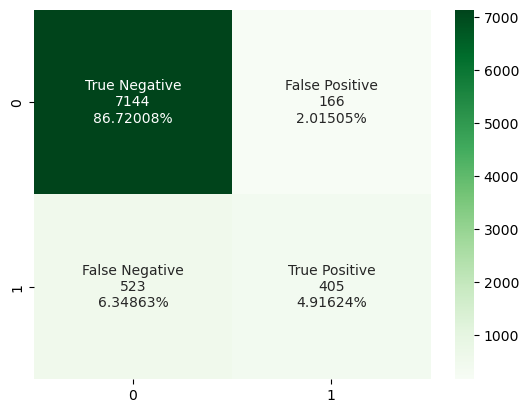

In [21]:
def confusion_matrix_plot(actual, prediction):
    cf_matrix = confusion_matrix(actual, prediction)
    group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
    group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
    group_percentages = ["{0:.5%}".format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Greens')
confusion_matrix_plot(y_test, y_test_preds)

### Problem 9: Score the Model

What is the accuracy of your model?

In [22]:
#Calculate performance metrics
thresh = 0.5
print('Baseline Logistic Regression Model')
print('Training:')
train_auc, train_accuracy, train_recall, train_precision, train_specificity, train_f1 = performance_report(y_train, y_train_preds, thresh)
print('Test:')
test_auc, test_accuracy, test_recall, test_precision, test_specificity, test_f1 = performance_report(y_test, y_test_preds, thresh)

Baseline Logistic Regression Model
Training:
        AUC  Accuracy  Recall  Precision  Specificity  Prevalence  F1 Score
value 0.695     0.910   0.417      0.660        0.973       0.113     0.511
Test:
        AUC  Accuracy  Recall  Precision  Specificity  Prevalence  F1 Score
value 0.707     0.916   0.436      0.709        0.977       0.113     0.540


The Logistic Regression model scored better on AUC, Accuracy, Precision, and F1 score and scored worse on Recall than our baseline models (Random and Most Frequent). 

### Problem 10: Model Comparisons

Now, we aim to compare the performance of the Logistic Regression model to our KNN algorithm, Decision Tree, and SVM models.  Using the default settings for each of the models, fit and score each.  Also, be sure to compare the fit time of each of the models.  Present your findings in a `DataFrame` similar to that below:

| Model | Train Time | Train Accuracy | Test Accuracy |
| ----- | ---------- | -------------  | -----------   |
|     |    |.     |.     |

In [23]:
#Initialize
knn = KNeighborsClassifier(n_neighbors = 100)
decision_tree = DecisionTreeClassifier(random_state = 42)
svm = SVC(random_state = 42)

#Create a df for results
comp_results = pd.DataFrame(columns=['Model', 'Train Time', 'Train Accuracy', 'Test Accuracy'])

In [24]:
#KNN
#Time and Fit
start_time = time.time()
knn.fit(X_train_scaled, y_train)
end_time = time.time()

#Train
train_acc_knn = accuracy_score(y_train, knn.predict(X_train_scaled))

#Test
test_acc_knn = accuracy_score(y_test, knn.predict(X_test_scaled))

#Test predictions
y_pred_knn = knn.predict(X_test_scaled)

#Calculate train time
train_time_knn = end_time - start_time

#Calculate AUC
auc_knn = roc_auc_score(y_test, y_pred_knn)

#Calculate confusion matrix
confusion_matrix_knn = confusion_matrix(y_test, y_pred_knn)

#Calculate recall
recall_knn = recall_score(y_test, y_pred_knn)

#Calculate precision
precision_knn = precision_score(y_test, y_pred_knn)

#Calculate specificity
specificity_knn = confusion_matrix_knn[0, 0] / (confusion_matrix_knn[0, 0] + confusion_matrix_knn[0, 1])

#Calculate prevalence
prevalence_knn = np.count_nonzero(y_test) / len(y_test)

#Calculate F1 score
f1_score_knn = f1_score(y_test, y_pred_knn)

#Store results
comp_results = pd.concat([comp_results, pd.DataFrame({
    'Model': ['KNN'],
    'Train Time': [train_time_knn],
    'Train Accuracy': [train_acc_knn],
    'Test Accuracy': [test_acc_knn],
    'AUC': [auc_knn],
    'Recall': [recall_knn],
    'Precision': [precision_knn],
    'Specificity': [specificity_knn],
    'Prevalence': [prevalence_knn],
    'F1 Score': [f1_score_knn]
})], ignore_index=True)

In [25]:
#Decision Tree
#Time and Fit
start_time = time.time()
decision_tree.fit(X_train_scaled, y_train)
end_time = time.time()

#Train
train_acc_dt = accuracy_score(y_train, decision_tree.predict(X_train_scaled))

#Test
test_acc_dt = accuracy_score(y_test, decision_tree.predict(X_test_scaled))

#Test predictions
y_pred_dt = decision_tree.predict(X_test_scaled)

#Calculate train time
train_time_dt = end_time - start_time

#Calculate AUC
auc_dt = roc_auc_score(y_test, y_pred_dt)

#Calculate confusion matrix
confusion_matrix_dt = confusion_matrix(y_test, y_pred_dt)

#Calculate recall
recall_dt = recall_score(y_test, y_pred_dt)

#Calculate precision
precision_dt = precision_score(y_test, y_pred_dt)

#Calculate specificity
specificity_dt = confusion_matrix_dt[0, 0] / (confusion_matrix_dt[0, 0] + confusion_matrix_dt[0, 1])

#Calculate prevalence
prevalence_dt = np.count_nonzero(y_test) / len(y_test)

#Calculate F1 score
f1_score_dt = f1_score(y_test, y_pred_dt)

#Store results
comp_results = pd.concat([comp_results, pd.DataFrame({
    'Model': ['Decision Tree'],
    'Train Time': [train_time_dt],
    'Train Accuracy': [train_acc_dt],
    'Test Accuracy': [test_acc_dt],
    'AUC': [auc_dt],
    'Recall': [recall_dt],
    'Precision': [precision_dt],
    'Specificity': [specificity_dt],
    'Prevalence': [prevalence_dt],
    'F1 Score': [f1_score_dt]
})], ignore_index=True)

In [26]:
#SVM
#Time and fit
start_time = time.time()
svm.fit(X_train_scaled, y_train)
end_time = time.time()

#Train
train_acc_svm = accuracy_score(y_train, svm.predict(X_train_scaled))

#Test
test_acc_svm = accuracy_score(y_test, svm.predict(X_test_scaled))

#Test predictions
y_pred_svm = svm.predict(X_test_scaled)

#Calculate train time
train_time_svm = end_time - start_time

#Calculate AUC
auc_svm = roc_auc_score(y_test, y_pred_svm)

#Calculate confusion matrix
confusion_matrix_svm = confusion_matrix(y_test, y_pred_svm)

#Calculate recall
recall_svm = recall_score(y_test, y_pred_svm)

#Calculate precision
precision_svm = precision_score(y_test, y_pred_svm)

#Calculate specificity
specificity_svm = confusion_matrix_svm[0, 0] / (confusion_matrix_svm[0, 0] + confusion_matrix_svm[0, 1])

#Calculate prevalence
prevalence_svm = np.count_nonzero(y_test) / len(y_test)

#Calculate F1 score
f1_score_svm = f1_score(y_test, y_pred_svm)

#Store results
comp_results = pd.concat([comp_results, pd.DataFrame({
    'Model': ['SVM'],
    'Train Time': [train_time_svm],
    'Train Accuracy': [train_acc_svm],
    'Test Accuracy': [test_acc_svm],
    'AUC': [auc_svm],
    'Recall': [recall_svm],
    'Precision': [precision_svm],
    'Specificity': [specificity_svm],
    'Prevalence': [prevalence_svm],
    'F1 Score': [f1_score_svm]
})], ignore_index=True)

In [27]:
#Print results
print(comp_results)

           Model  Train Time  Train Accuracy  Test Accuracy   AUC  Recall  \
0            KNN       0.016           0.899          0.901 0.592   0.193   
1  Decision Tree       0.273           1.000          0.895 0.737   0.533   
2            SVM      24.480           0.927          0.914 0.695   0.413   

   Precision  Specificity  Prevalence  F1 Score  
0      0.737        0.991       0.113     0.306  
1      0.533        0.941       0.113     0.533  
2      0.705        0.978       0.113     0.521  


### Problem 11: Improving the Model

Now that we have some basic models on the board, we want to try to improve these.  Below, we list a few things to explore in this pursuit.

- More feature engineering and exploration.  For example, should we keep the gender feature?  Why or why not?
- Hyperparameter tuning and grid search.  All of our models have additional hyperparameters to tune and explore.  For example the number of neighbors in KNN or the maximum depth of a Decision Tree.  
- Adjust your performance metric

# Conclusion
### Observations
- The training time is shortest for KNN at 0.012. The Decision Tree model took almost 20x longer to train than KNN at 0.219. The SVM  took 2000x longer to train than KNN or 100x longer than the Decision Tree model at 24.739. SVM takes significantly longer than the other models. 
- The Decision Tree model has the highest training accuracy of 1.000. The SVM was next with training accuracy of 0.927. Lastly the KNN had the lowest training accuracy at 0.899. All three have pretty high training accuracies.
- The SVM has the high test accuracy at 0.914. This is followed by KNN with a test accuracy of 0.901. The Decision Tree has the lowest training accuracy but not by much of 0.895.
- The Decision Tree model has the highest AUC (0.737) followed by SVM (0.695), and KNN (0.592).
- The Decision Tree model has the highest Recall (0.533) followed by SVM (0.413) and KNN (0.193).
- The KNN model has the highest precision (0.737) followed by SVM (0.705) and Decision Tree (0.533).
- The KNN has the highest specificity (0.991) followed by SVM (0.978) and Decision Tree (0.941).
- All three models (KNN, Decision Tree, SVM) have the same prevalence of 0.113.
- The Decision Tree has the highest F1 score (0.533) followed by SVM (0.521) and KNN (0.316).
- Our baseline models are Most Frequent and Random. Random actually performed better (3x) or the same (1x) than Most Frequent that performed better (1x) and the same (1x).

### Next Steps and Recommendations
- Train more models such as Random Forest and Guassian Naive Bayes. This project focused on four models (Linear Regression, KNN, Decision Tree, and SVM), but exploring additional models could produce additional results. 
- Explore addional feature engineering to take out certain features or change the way nulls are replaced. We can also treat encodings differently, for example the 999 values. 
- We could quantify the cost of a campaign and the gain of a successful deposit. How much does it cost when customers deposit incorrectly or they are misclassified? How much does it benefit the bank when the deposits are successfully classfied and deposited?
